Name - Jinal Vyas
ASU ID - 1233053785
# Model Training and Evaluation for Segmentation of Glacier Images

# Here, I am keeping the initial code from part-2, because it includes comparing three models, and i have done in-detailed post analysis to find the best of the three performing models.

For best visualization of geomaps, i recommend viewing this file in google colab because of its support for google earth engine, however i have plotted the final output files and required plot using matplotlib, so it is platform independent only.

So here, for segmentation, I am using UNet as a base model with three different encoders: ResNet34, ResNet50 and EfficientNet-b4 and Dice Loss as the Evaluation Metric.

Explanation of model choice:
ResNet34, ResNet50, and EfficientNet-B4 were chosen as they are popular backbone architectures with varying complexities, enabling a comparison of performance based on model depth and efficiency:
ResNet34: A relatively lightweight model suitable for smaller datasets with faster training and inference.
ResNet50: A deeper model with higher capacity, useful for more complex datasets but prone to overfitting.
EfficientNet-B4: A highly efficient model that balances accuracy and computational cost using compound scaling.

Dice Loss was chosen as the evaluation metric because:
It directly measures the overlap between the predicted and ground truth segmentation masks.
It is particularly effective for imbalanced datasets, ensuring small regions are not overlooked.
Dice Loss focuses on pixel-level accuracy, making it ideal for image segmentation tasks where precise boundaries are critical.
By optimizing Dice Loss, the model maximizes overlap and minimizes false positives/negatives, ensuring better segmentation performance.


In [1]:
# Install the Rasterio library, which is used for reading and writing geospatial raster data
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 25.1 MB/s eta 0:00:00


In [2]:
# Install the segmentation_models_pytorch library for pretrained segmentation model, U-Net in this case, with three different encoders
!pip install segmentation_models_pytorch

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 31.6 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=40314463028dc2c9ea825b170e1d88372412b6793a55438c756b654b82a94243
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=04aac23e2377a911058300e769dafcc50270c8f092497ddc6334e3f1cba69c01
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch

In [3]:
# installing required libraries
import ee
import geemap.core as geemap
import torch
import rasterio
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from osgeo import gdal
import seaborn as sns
import time
from tqdm import tqdm
import cv2
from google.colab.patches import cv2_imshow
import os
from PIL import Image
import segmentation_models_pytorch as smp
from sklearn.model_selection import KFold

In [4]:
# authenticating the access of google earth engine
ee.Authenticate()
ee.Initialize(project='ee-jinalvyasict19')

In [5]:
# Landsat-8 was launched in february, 2013, hence am considering data of past 10 years starting from Jan, 2014 to Dec, 2023, thus covering almost maximum data possible
# I am combining the data of every month into a single image through its median, hence i am generating one image per month, in total, I received 120 images for 10 years
# However, due to cloud mask, 38 images were found complelely empty/corrupted, so i dropped them and am using 82 images for building and testing the model
# 10% of images among those 82 may have very less data but still I am using it for training and testing to inculcate variation in data fed to the model
dataset = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2').filterDate(
    '2023-06-01', '2023-12-01'
)
# masking alaska's mendenhall glacier coordinates
alaska_bounds = ee.Geometry.Polygon([[-134.62, 58.42], [-134.62, 58.59], [-134.42, 58.59], [-134.42, 58.42]])

# selecting the appropriate bands required, in the data preprocessing part, i have indetailed explained the reason behind choosing each of the bands, hence just providing a brief here.
# Optical Bands (SR_B3 to SR_B7): Represent visible, near-infrared (NIR), and shortwave infrared (SWIR) wavelengths, crucial for vegetation, water, and land-cover analysis.
# Thermal Bands (ST_B.*): Capture surface temperature, useful for monitoring heat and environmental conditions.
def apply_scale_factors(image):
  global alaska_bounds
  optical_bands = image.select(['SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']).multiply(0.0000275).add(-0.2)
  thermal_bands = image.select('ST_B.*').multiply(0.00341802).add(149.0)
  image_with_bands =  image.addBands(optical_bands, None, True).addBands(
      thermal_bands, None, True
  )
  return image_with_bands.clip(alaska_bounds)

# clouds many times distort the true images, hence it is crucial to apply cloud mask and remove the regions covered/distorted due to clouds
def mask_clouds_shadows(image):
  qa_mask = image.select('QA_PIXEL')
  cloud_mask = (qa_mask.bitwiseAnd(1 << 3)).eq(0)
  shadow_mask = (qa_mask.bitwiseAnd(1 << 4)).eq(0)
  mask = cloud_mask.And(shadow_mask)
  return image.updateMask(mask)

dataset = dataset.map(apply_scale_factors)
dataset = dataset.map(mask_clouds_shadows)

visualization = {
    'bands': ['SR_B4', 'SR_B3', 'SR_B2'],
    'min': 0.0,
    'max': 0.3,
}

map = geemap.Map()
map.centerObject(alaska_bounds, 10)
map.add_layer(dataset, visualization, 'True Color (432)')
map

Map(center=[58.504970268291245, -134.5199999999993], controls=(ZoomControl(options=['position', 'zoom_in_text'…

In [6]:
# applying preprocessing to the images of past ten years i.e. ranging from January, 2014 to December, 2023
images = {}

for year in tqdm(range(2014, 2024)):
  for month in tqdm(range(1, 13)):
    if month != 2:
      dataset = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2').filterDate(
        rf'{year}-{month}-01', rf'{year}-{month}-30'
      )
    else:
      dataset = ee.ImageCollection('LANDSAT/LC08/C02/T1_L2').filterDate(
        rf'{year}-{month}-01', rf'{year}-{month}-28'
      )
    dataset = dataset.map(apply_scale_factors)
    dataset = dataset.map(mask_clouds_shadows)
    # the reason I am taking median and not all the images of every month is, the frequency of Landsat-8 is every 16 days, so no more than 2 images can be obtained each month
    # and also there is a good probability that either of those image may be corrupted due to clouds hovering above the glacier, hence taking median seems like an optimum choice,
    # as median will also be less affacted by the outliers (which may be the NaN values recorded due to cloud mask.)
    images[f'{year}-{month}'] = dataset.median()
images

100%|██████████| 12/12 [00:00<00:00, 216.29it/s]

100%|██████████| 12/12 [00:00<00:00, 129.53it/s]

100%|██████████| 12/12 [00:00<00:00, 55.89it/s]

100%|██████████| 10/10 [00:01<00:00,  6.48it/s]


{'2014-1': <ee.image.Image at 0x7d7b9dc72fe0>,
 '2014-2': <ee.image.Image at 0x7d7b9d70c040>,
 '2014-3': <ee.image.Image at 0x7d7b9dcab130>,
 '2014-4': <ee.image.Image at 0x7d7b9dcaab60>,
 '2014-5': <ee.image.Image at 0x7d7b9dd15c00>,
 '2014-6': <ee.image.Image at 0x7d7b9dd4b070>,
 '2014-7': <ee.image.Image at 0x7d7b9d2352d0>,
 '2014-8': <ee.image.Image at 0x7d7b9d236800>,
 '2014-9': <ee.image.Image at 0x7d7b9d2342b0>,
 '2014-10': <ee.image.Image at 0x7d7b9d29c640>,
 '2014-11': <ee.image.Image at 0x7d7b9d29d6f0>,
 '2014-12': <ee.image.Image at 0x7d7b9d29e6e0>,
 '2015-1': <ee.image.Image at 0x7d7b9dd04940>,
 '2015-2': <ee.image.Image at 0x7d7b9dca9a50>,
 '2015-3': <ee.image.Image at 0x7d7b9dd061d0>,
 '2015-4': <ee.image.Image at 0x7d7b9dc62770>,
 '2015-5': <ee.image.Image at 0x7d7b9dc62260>,
 '2015-6': <ee.image.Image at 0x7d7b9dc63e20>,
 '2015-7': <ee.image.Image at 0x7d7b9de7ea40>,
 '2015-8': <ee.image.Image at 0x7d7b9d724640>,
 '2015-9': <ee.image.Image at 0x7d7b9d726e60>,
 '2015-10'

In [7]:
# mounting google drive, for easy storage and access of data
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# Creating tasks for downloading the images to a folder named, 'Alasks Dataset', in the drive, it is approximately of 2.5 Gbs, here scale = 30 is used for better resolution.
for date, image in tqdm(images.items()):
    export_task = ee.batch.Export.image.toDrive(
        image=image,
        description=f'image_{date}',
        folder='Alaska_Dataset',
        region=alaska_bounds,
        scale=30,
        fileFormat = 'GeoTIFF',
        maxPixels=1e13
    )
    export_task.start()
    while export_task.active():
      pass

100%|██████████| 120/120 [1:16:02<00:00, 38.02s/it]


In [ ]:
# Here, using the tiff files derived from the above task, I am extracting the bands 3 to 7, replacing NaN values with 0, so that it won't cause any problem during visualization
# Then, using bands 3, 4 and 5, I am plotting RGB images, and also NDSI ( Normalized Difference Snow Index, I have explained this in depth during the first part of submission) images.
# Here, as visually representable, RGB images better distinguish the glacier from NDSI images, hence I will be using RGB images for creating binary masks.

# I am also applying thresholding of rgb_image.max() == 1, such that months producing empty tif files due to cloud interference, won't be converted to rbg, as we don't need them for training.
for files in images.keys():
  file_path = f"/content/drive/My Drive/Alaska_Dataset/image_{files}.tif"
  try:
      with rasterio.open(file_path) as src:
          band_3 = src.read(3)
          band_4 = src.read(4)
          band_5 = src.read(5)
          band_6 = src.read(6)
          band_7 = src.read(7)

      band_3 = np.nan_to_num(band_3, nan=0)
      band_4 = np.nan_to_num(band_4, nan=0)
      band_5 = np.nan_to_num(band_5, nan=0)
      band_6 = np.nan_to_num(band_6, nan=0)
      band_7 = np.nan_to_num(band_7, nan=0)

      band_3_flat = band_3.flatten()
      band_4_flat = band_4.flatten()
      band_5_flat = band_5.flatten()
      band_6_flat = band_6.flatten()
      band_7_flat = band_7.flatten()
      band_5_norm = band_5 / band_5.max()
      band_4_norm = band_4 / band_4.max()
      band_3_norm = band_3 / band_3.max()

      rgb_image = np.stack((band_5_norm, band_4_norm, band_3_norm), axis=-1)
      NDSI = (band_3 - band_6) / (band_3 + band_6)
      if rgb_image.max() == 1:
        plt.figure(figsize=(10, 10))
        plt.imshow(rgb_image)
        plt.title("False Color Composite (NIR, Red, Green)")
        plt.axis('off')
        plt.savefig(f"/content/drive/My Drive/Alaska_Dataset/image_{files}.png")
        plt.show()
        plt.figure(figsize=(7, 7))
        plt.imshow(NDSI, cmap='Spectral')
        plt.title('Normalized Difference Snow Index (NDSI)')
        plt.colorbar()
        plt.axis('off')
        plt.clim(-5, 1)
        plt.savefig(f"/content/drive/My Drive/Alaska_Dataset/image_{files}_NDSI.png")
        plt.show()
  except Exception as e:
    print(e)

In [ ]:
# I am creating binary masks using the RGB images and OpenCV, first I am converting them to grayscale, and then apply thresholding such that the glacier region will be marked as while
# and the non-glacier region, including land and vegetation will be marked as black. I am also cropping the image to remove the title bar which I simply added for visualization purpose,
# as it can cause discrepancy in the segmentation.
for files in images.keys():
  file_path = rf"/content/drive/My Drive/Alaska_Dataset/image_{files}.png"
  if not os.path.exists(file_path):
    print(f'image_{files}.png was not saved, because it contained no data!')
    continue
  file_path = rf"/content/drive/My Drive/Alaska_Dataset/image_{files}.png"
  img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
  # print(img)
  _, mask = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)
  # cv2.imwrite(f"/content/drive/My Drive/Alaska_Dataset/mask_{files}.png", mask)
  x, y, w, h = 55, 82, 400, 340
  cropped_mask = mask[y:y+h, x:x+w]
  cv2_imshow(cropped_mask)
  cv2.waitKey(0)
  cv2.destroyAllWindows()
  cv2.imwrite(f"/content/drive/My Drive/Alaska_Dataset/mask_{files}.png", cropped_mask)

In [8]:
# I am creating a custom dataset such that it apply transformation to the images and masks, here i am keeping 224*224 as image size, however depending on the model parameters it can be
# modified, for example, larger models will function better on 512*512 images, and rather overfit on smaller sized images. However here my region of interest is limited to the glacier,
# hence 224*224 seems like an appropriate choice.
class SegmentationDataset(Dataset):
  def __init__(self, image_path, mask_path, transformr=None):
    self.image_paths = image_path
    self.mask_paths = mask_path
    self.transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize the image
        transforms.ToTensor(),                       # Convert to tensor
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
    ])
    self.mask_transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize the image
        transforms.ToTensor()
    ])
  def __len__(self):
    return len(self.image_paths)
  def __getitem__(self, idx):
    image = Image.open(self.image_paths[idx]).convert("RGB")
    x, y, w, h = 55, 82, 400, 340
    cropped_image = self.transform(image.crop((x, y, x + w, y + h)))
    mask = self.mask_transform(Image.open(self.mask_paths[idx]))
    # print(image.shape, mask.shape)
    return cropped_image, mask

In [9]:
# I am appending all the rgb image paths and mask paths to two variables, which I will later use for splitting into training and testing data.
image_paths = []
mask_paths = []
for files in images.keys():
  image_path = rf"/content/drive/My Drive/Alaska_Dataset/image_{files}.png"
  if not os.path.exists(image_path):
    print(f'image_{files}.png was not saved, because it contained no data!')
    continue
  mask_path = rf"/content/drive/My Drive/Alaska_Dataset/mask_{files}.png"
  image_paths.append(image_path)
  mask_paths.append(mask_path)
image_paths, mask_paths

image_2014-1.png was not saved, because it contained no data!
image_2014-9.png was not saved, because it contained no data!
image_2014-12.png was not saved, because it contained no data!
image_2015-1.png was not saved, because it contained no data!
image_2015-2.png was not saved, because it contained no data!
image_2015-11.png was not saved, because it contained no data!
image_2015-12.png was not saved, because it contained no data!
image_2016-1.png was not saved, because it contained no data!
image_2016-8.png was not saved, because it contained no data!
image_2016-11.png was not saved, because it contained no data!
image_2016-12.png was not saved, because it contained no data!
image_2017-1.png was not saved, because it contained no data!
image_2017-10.png was not saved, because it contained no data!
image_2017-12.png was not saved, because it contained no data!
image_2018-1.png was not saved, because it contained no data!
image_2018-8.png was not saved, because it contained no data!
i

(['/content/drive/My Drive/Alaska_Dataset/image_2014-2.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-3.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-4.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-5.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-6.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-7.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-8.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-10.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-11.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-3.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-4.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-5.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-6.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-7.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-8.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2015-9.png',
  '/content/drive/My D

In [10]:
# as explained earlier, these arer total number of images I got after filtering cloud mask, and taken median of dataset per month, over a period of ten years.
len(image_paths)

82

In [11]:
# defining device type, here I am using T4 GPU provided by google colab.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [12]:
# defining the train function for single epoch, which returns the total loss per epoch i.e. the loss averaged over multiple batches.
def train(model, train_loader, optimizer, loss, device):
  model.train()
  epoch_loss = 0
  for images, masks in train_loader:
    images = images.to(device)
    masks = masks.to(device)
    outputs = model(images)
    # print(outputs.shape, masks.shape)
    batch_loss = loss(outputs, masks)
    optimizer.zero_grad()
    batch_loss.backward()
    optimizer.step()
    epoch_loss += batch_loss.item()
  return epoch_loss/len(train_loader)

In [13]:
# defining the testing function, which return the total testing loss per epoch, averaged over the batches of test_loader.
def test(model, test_loader, loss, device):
  model.eval()
  test_loss = 0
  with torch.no_grad():
    for images, masks in test_loader:
      images = images.to(device)
      masks = masks.to(device)
      outputs = model(images)
      batch_loss = loss(outputs, masks)
      test_loss += batch_loss.item()
  return test_loss/len(test_loader)

In [14]:
# this function is used to plot all the images in the test loader. there are three images being plotted, one is the original image, second the true mask and third being the segmented mask by the model
def test_image_plot(test_loader, model):
  for images, masks in test_loader:
        images = images.to(device)
        masks = masks.to(device)
        outputs = model(images)
        pred_masks = (outputs > 0.5).float()
        for image, mask, pred_mask in zip(images, masks, pred_masks):
          fig, axs = plt.subplots(1, 3, figsize=(15, 5))
          axs[0].imshow(image.cpu().numpy().transpose(1, 2, 0))  # Convert tensor to numpy (C, H, W) -> (H, W, C)
          axs[0].set_title("Original Image")
          axs[1].imshow(mask.cpu().numpy().squeeze(), cmap='gray')  # Mask is single channel, squeeze it
          axs[1].set_title("Ground Truth Mask")
          axs[1].axis('off')
          axs[2].imshow(pred_mask.cpu().numpy().squeeze(), cmap='gray')  # Predicted mask (squeeze to remove channel)
          axs[2].set_title("Predicted Mask")
          axs[2].axis('off')
          plt.show()

In [15]:
# sorting the images and masks as per date and time, to make sure the indexes of both the lists are synchronized.
image_paths.sort()
mask_paths.sort()
image_paths[:5], mask_paths[:5]

(['/content/drive/My Drive/Alaska_Dataset/image_2014-10.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-11.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-2.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-3.png',
  '/content/drive/My Drive/Alaska_Dataset/image_2014-4.png'],
 ['/content/drive/My Drive/Alaska_Dataset/mask_2014-10.png',
  '/content/drive/My Drive/Alaska_Dataset/mask_2014-11.png',
  '/content/drive/My Drive/Alaska_Dataset/mask_2014-2.png',
  '/content/drive/My Drive/Alaska_Dataset/mask_2014-3.png',
  '/content/drive/My Drive/Alaska_Dataset/mask_2014-4.png'])

In [16]:
# For testing the model, I am using 20% of the data, i.e. I will divide these indices into 80-20 split.
# However, keeping one image separate to compare segmentation output mask produced the best wieghts of all the three models. Hence taking images till 0 to 80, and keeping 81 separate.

indices = list(range(len(image_paths[:81])))
indices

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80]

In [17]:
# Initialize K-Fold Cross-Validation with 5 splits
# shuffle=True ensures the data is randomly shuffled before splitting
# random_state=42 ensures reproducibility of the splits
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
kf

KFold(n_splits=5, random_state=42, shuffle=True)

# UNet with Encoder ResNet34 - Training and Evaluation

In [18]:
# here i will be iterating over 5 folds and in each fold, i am dividing the data into 80-20 split i.e. the default split for k=5
# Hence as visible, there are 65-66 training images every iteration and 16-17 test images.
# I am globally defining one variable called model_best_loss, which will track when the TEST loss function is at its least across all the folds and all the epochs, and save that model as
# the best model obtained.
# I am using resnet34 as my encoder here, with pretrained weights.
k_folds_results = []
resnet34_best_test_loss = 10000
# As explained earlier in the initial cells, I am using Dice Loss as my evaluation metric as it minimizes overlap errors and improves boundary alignment in segmentation tasks.
loss = smp.losses.DiceLoss(mode='binary')
for fold, (train_index, test_index) in enumerate(kf.split(indices)):
  train_image_paths = [image_paths[i] for i in train_index]
  train_mask_paths = [mask_paths[i] for i in train_index]
  test_image_paths = [image_paths[i] for i in test_index]
  test_mask_paths = [mask_paths[i] for i in test_index]
  print(len(train_index), len(test_index))
  train_dataset = SegmentationDataset(train_image_paths, train_mask_paths)
  test_dataset = SegmentationDataset(test_image_paths, test_mask_paths)
  train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
  test_loader = DataLoader(test_dataset, batch_size=8, shuffle=True)
  model = smp.Unet(
    encoder_name="resnet34",  #encoder defined
    encoder_weights="imagenet",  #imagenet pretrained weights are used
    in_channels=3, #3 classes as input images are RGB
    classes=1 #as output is supposed to be a binary mask, hence 1 output classes only.
  )
  model = model.to(device)
  # here I am using the classic Adam as an optimizer with learning rate 1e-4, decreasing it from here would have caused the model on overfit because of the limited number of training images.
  # Adam optimizer was chosen because:
  # - It combines the benefits of Momentum and RMSprop, adapting the learning rate for each parameter.
  # - It is computationally efficient and works well for large datasets and high-dimensional problems.
  # - Adam performs well with minimal hyperparameter tuning, making it a reliable choice for most tasks.
  # - Its adaptive nature ensures faster convergence and robustness to noisy gradient
  # And the model didn't overfit with the given hyperparameters, hence i didn't provide weight decay or any sort of regularization.
  optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
  for epoch in tqdm(range(30)):
    train_loss = train(model, train_loader, optimizer, loss, device)
    test_loss = test(model, test_loader, loss, device)
    if test_loss < resnet34_best_test_loss:
        resnet34_best_test_loss = test_loss
        torch.save(model.state_dict(), f"Best_model_resnet34.pth")
        print('\nBest Model Saved with Test Loss: ', resnet34_best_test_loss)
        best_test_loader = test_loader
  k_folds_results.append(test_loss)
print("\nCross Validation Results: ", k_folds_results)
print("\nAverage_loss: ", sum(k_folds_results)/len(k_folds_results))

64 17


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 178MB/s]
  3%|▎         | 1/30 [01:05<31:40, 65.53s/it]


Best Model Saved with Test Loss:  0.43397557735443115


  7%|▋         | 2/30 [01:08<13:26, 28.82s/it]


Best Model Saved with Test Loss:  0.4210205078125


 10%|█         | 3/30 [01:12<07:49, 17.38s/it]


Best Model Saved with Test Loss:  0.34245532751083374


 13%|█▎        | 4/30 [01:16<05:15, 12.13s/it]


Best Model Saved with Test Loss:  0.20578938722610474


 17%|█▋        | 5/30 [01:19<03:38,  8.72s/it]


Best Model Saved with Test Loss:  0.1909628709157308


 23%|██▎       | 7/30 [01:24<02:02,  5.31s/it]


Best Model Saved with Test Loss:  0.1621051033337911


 30%|███       | 9/30 [01:29<01:18,  3.75s/it]


Best Model Saved with Test Loss:  0.14238115151723227


 40%|████      | 12/30 [01:36<00:53,  2.95s/it]


Best Model Saved with Test Loss:  0.1290393869082133


 47%|████▋     | 14/30 [01:41<00:42,  2.69s/it]


Best Model Saved with Test Loss:  0.12479044993718465


 50%|█████     | 15/30 [01:44<00:38,  2.59s/it]


Best Model Saved with Test Loss:  0.11434956391652425


 53%|█████▎    | 16/30 [01:47<00:37,  2.71s/it]


Best Model Saved with Test Loss:  0.11301668485005696


 57%|█████▋    | 17/30 [01:49<00:35,  2.72s/it]


Best Model Saved with Test Loss:  0.10837630430857341


 60%|██████    | 18/30 [01:52<00:32,  2.71s/it]


Best Model Saved with Test Loss:  0.10548104842503865


 63%|██████▎   | 19/30 [01:55<00:29,  2.73s/it]


Best Model Saved with Test Loss:  0.09955310821533203


 73%|███████▎  | 22/30 [02:02<00:21,  2.65s/it]


Best Model Saved with Test Loss:  0.0928419828414917


 80%|████████  | 24/30 [02:07<00:15,  2.54s/it]


Best Model Saved with Test Loss:  0.08815499146779378


 87%|████████▋ | 26/30 [02:12<00:09,  2.49s/it]


Best Model Saved with Test Loss:  0.08766223986943562


 90%|█████████ | 27/30 [02:15<00:08,  2.69s/it]


Best Model Saved with Test Loss:  0.08430798848470052


100%|██████████| 30/30 [02:24<00:00,  4.80s/it]


Best Model Saved with Test Loss:  0.08100565274556477
65 16



100%|██████████| 30/30 [01:09<00:00,  2.32s/it]


65 16


100%|██████████| 30/30 [01:09<00:00,  2.31s/it]


65 16


100%|██████████| 30/30 [01:09<00:00,  2.31s/it]


65 16


100%|██████████| 30/30 [01:09<00:00,  2.31s/it]


Cross Validation Results:  [0.08100565274556477, 0.09677454829216003, 0.14236590266227722, 0.11751607060432434, 0.09173277020454407]

Average_loss:  0.10587898890177408


In [19]:
# here best test loader means the split for which the test loss was recorded at its minimum.
len(best_test_loader.dataset)

17

<ipython-input-20-1532a440afdb>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('Best_model_resnet34.pth'))


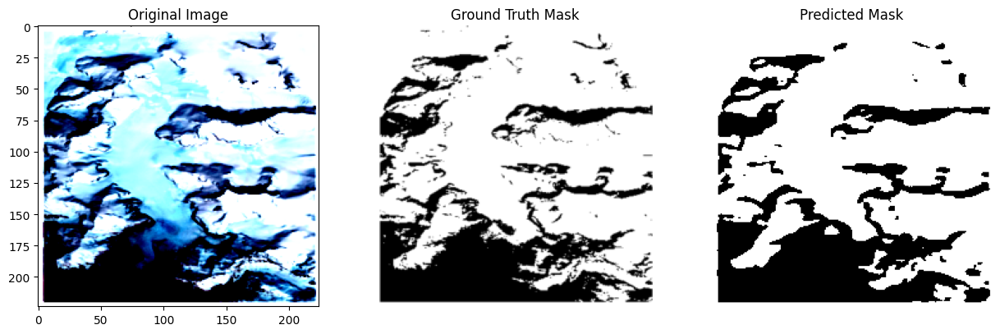

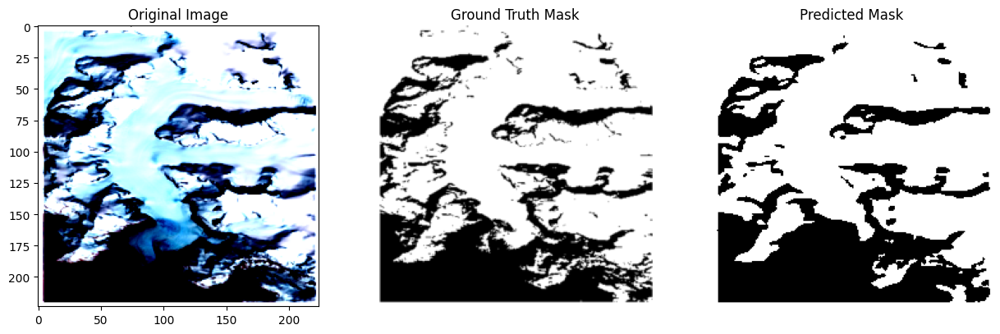

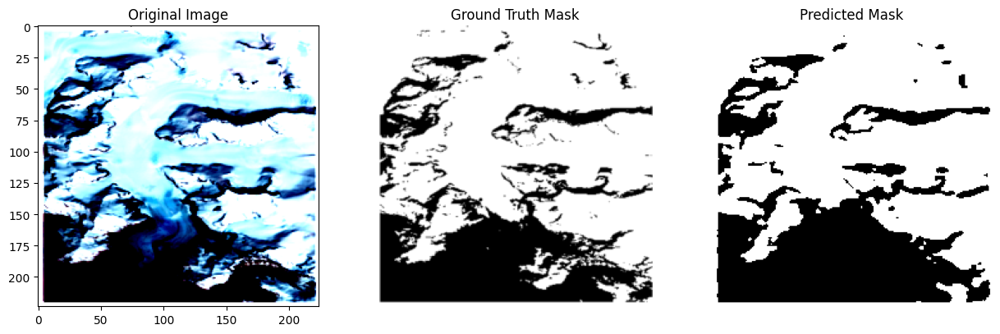

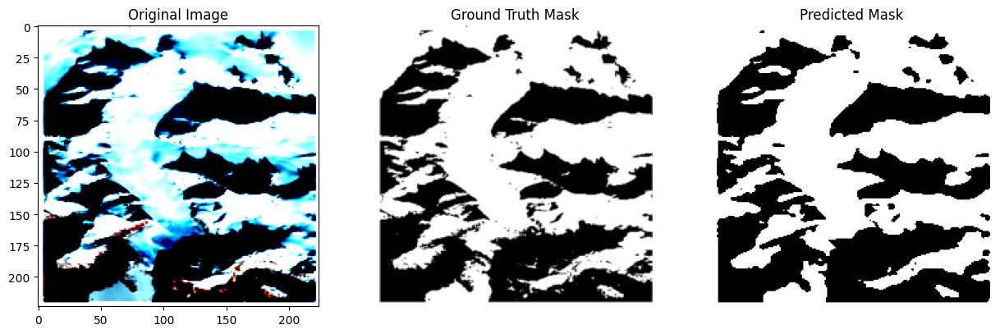

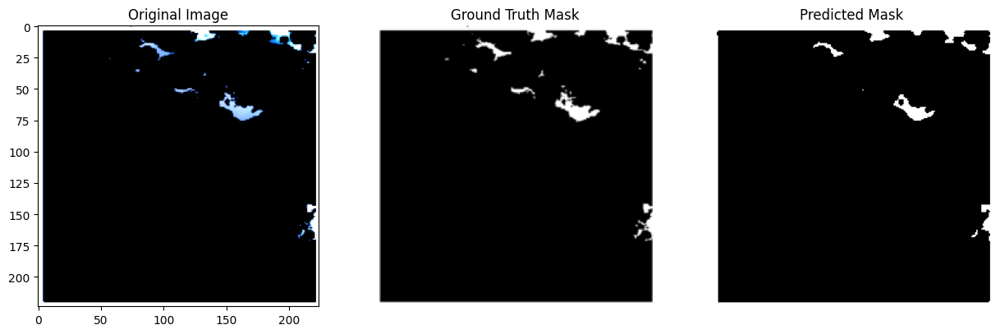

...

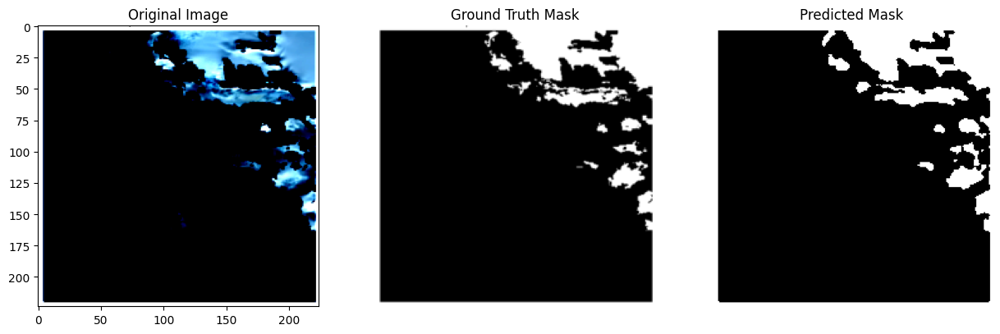

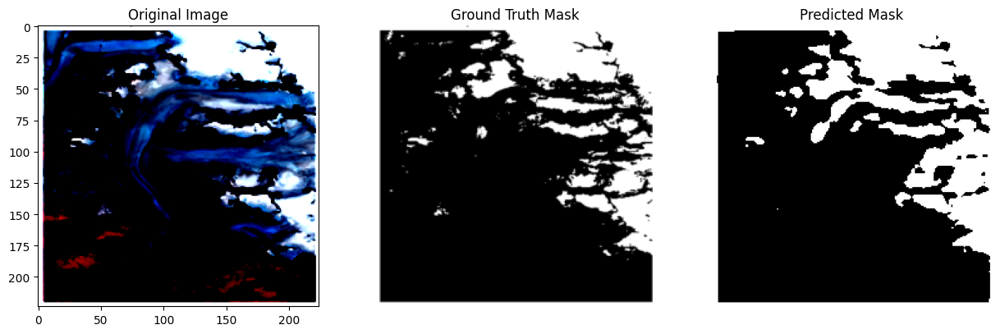

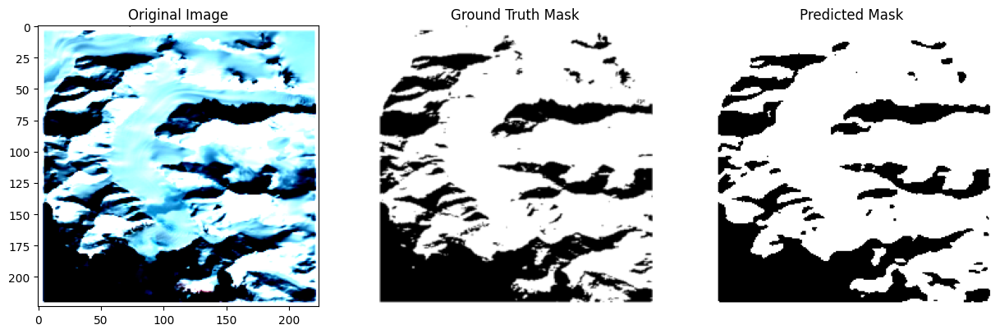

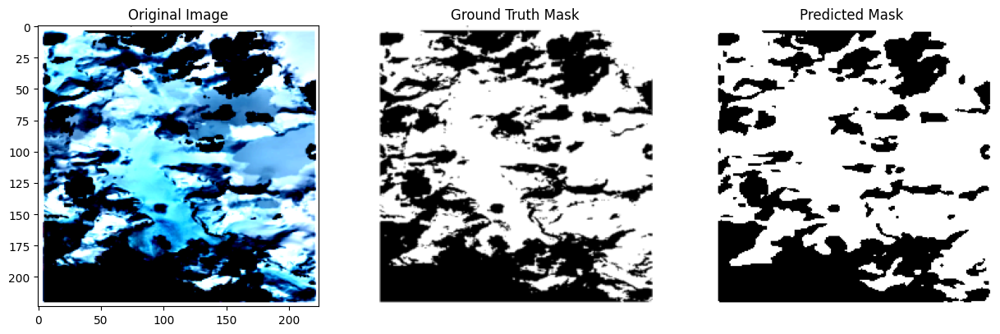

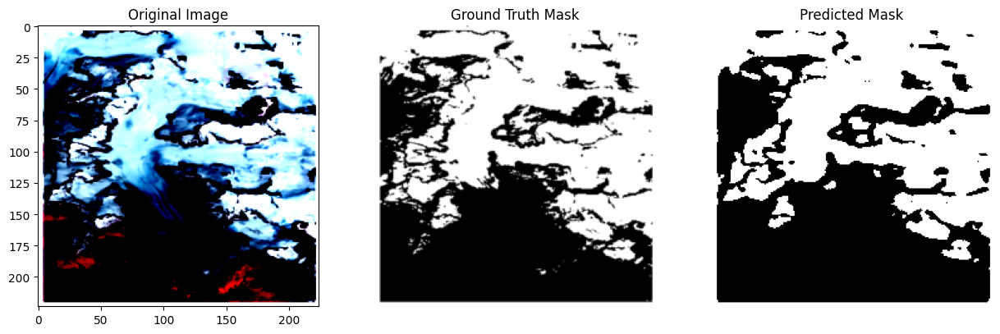

In [20]:
# Visualizing the model output on the best-picked test data, as seen the predicted mask won't be as perfect and as accurate as the true mask, however this can be refined with more
# and more training, for this case, i felt that 30 epochs were sufficient to produce acceptable output, as this is a case of semantic segmentation.
# However incase of larger region of interest and more classes or cases with instance segmentation, more number of epochs may be required.
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
  )
model = model.to(device)
model.load_state_dict(torch.load('Best_model_resnet34.pth'))
test_image_plot(best_test_loader, model)

# UNet with Encoder ResNet50 - Training and Evaluation

In [21]:
# keeping all the parameters same for fair comparison, except the encoder, this time, I am using ResNet50 as the encoder and again utilizing DICE LOSS as my evaluation metrics.
k_folds_results = []
resnet50_best_test_loss = 10000
loss = smp.losses.DiceLoss(mode='binary')
for fold, (train_index, test_index) in enumerate(kf.split(indices)):
  train_image_paths = [image_paths[i] for i in train_index]
  train_mask_paths = [mask_paths[i] for i in train_index]
  test_image_paths = [image_paths[i] for i in test_index]
  test_mask_paths = [mask_paths[i] for i in test_index]
  print(len(train_index), len(test_index))
  train_dataset = SegmentationDataset(train_image_paths, train_mask_paths)
  test_dataset = SegmentationDataset(test_image_paths, test_mask_paths)
  train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
  test_loader = DataLoader(test_dataset, batch_size=8, shuffle=True)
  model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
  )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
  for epoch in tqdm(range(30)):
    train_loss = train(model, train_loader, optimizer, loss, device)
    test_loss = test(model, test_loader, loss, device)
    if test_loss < resnet50_best_test_loss:
        resnet50_best_test_loss = test_loss
        torch.save(model.state_dict(), f"Best_model_resnet50.pth")
        print('\nBest Model Saved with Test Loss: ', resnet50_best_test_loss)
        resnet50_best_test_loader = test_loader
  k_folds_results.append(test_loss)
print("\nCross Validation Results: ", k_folds_results)
print("\nAverage_loss: ", sum(k_folds_results)/len(k_folds_results))

64 17


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 216MB/s]
  3%|▎         | 1/30 [00:03<01:34,  3.25s/it]


Best Model Saved with Test Loss:  0.5683464209238688


  7%|▋         | 2/30 [00:06<01:29,  3.20s/it]


Best Model Saved with Test Loss:  0.31959615151087445


 13%|█▎        | 4/30 [00:12<01:19,  3.05s/it]


Best Model Saved with Test Loss:  0.20027210315068564


 30%|███       | 9/30 [00:26<01:01,  2.91s/it]


Best Model Saved with Test Loss:  0.1463657021522522


 33%|███▎      | 10/30 [00:30<01:00,  3.03s/it]


Best Model Saved with Test Loss:  0.1407331625620524


 37%|███▋      | 11/30 [00:33<00:58,  3.06s/it]


Best Model Saved with Test Loss:  0.14008078972498575


 43%|████▎     | 13/30 [00:39<00:52,  3.10s/it]


Best Model Saved with Test Loss:  0.1374316414197286


 50%|█████     | 15/30 [00:45<00:44,  2.97s/it]


Best Model Saved with Test Loss:  0.12121532360712688


 53%|█████▎    | 16/30 [00:48<00:44,  3.19s/it]


Best Model Saved with Test Loss:  0.11623650789260864


 60%|██████    | 18/30 [00:55<00:37,  3.13s/it]


Best Model Saved with Test Loss:  0.11049691836039226


 63%|██████▎   | 19/30 [00:58<00:34,  3.15s/it]


Best Model Saved with Test Loss:  0.10581533114115398


 70%|███████   | 21/30 [01:04<00:28,  3.19s/it]


Best Model Saved with Test Loss:  0.10520986715952556


 83%|████████▎ | 25/30 [01:16<00:14,  2.98s/it]


Best Model Saved with Test Loss:  0.09534839789072673


 87%|████████▋ | 26/30 [01:19<00:12,  3.15s/it]


Best Model Saved with Test Loss:  0.09269265333811443


 93%|█████████▎| 28/30 [01:25<00:06,  3.07s/it]


Best Model Saved with Test Loss:  0.09195496638615926


100%|██████████| 30/30 [01:31<00:00,  3.06s/it]


Best Model Saved with Test Loss:  0.08649138609568278
65 16



100%|██████████| 30/30 [01:22<00:00,  2.76s/it]


65 16


100%|██████████| 30/30 [01:22<00:00,  2.76s/it]


65 16


100%|██████████| 30/30 [01:22<00:00,  2.76s/it]


65 16


100%|██████████| 30/30 [01:23<00:00,  2.78s/it]


Cross Validation Results:  [0.08649138609568278, 0.11124193668365479, 0.10492351651191711, 0.10185813903808594, 0.0926923155784607]

Average_loss:  0.09944145878156027


<ipython-input-22-01c725dc0aa7>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('Best_model_resnet50.pth'))


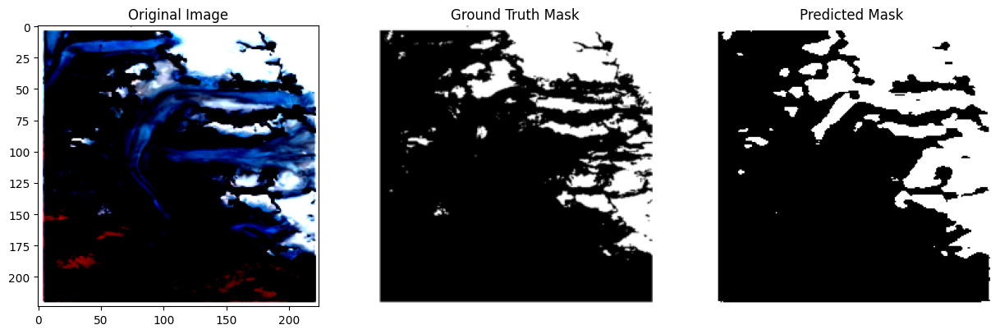

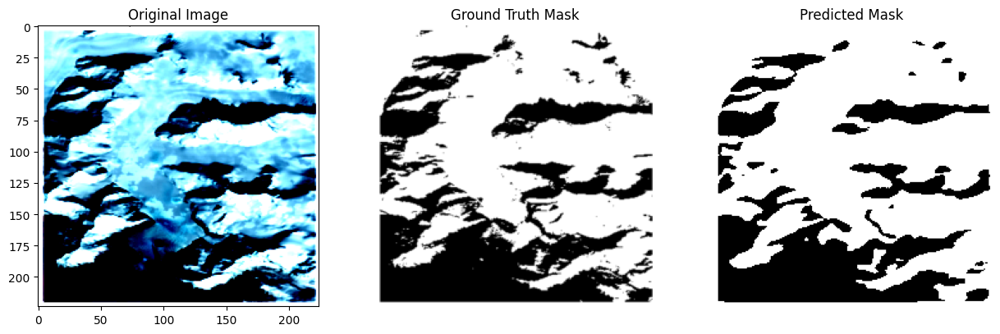

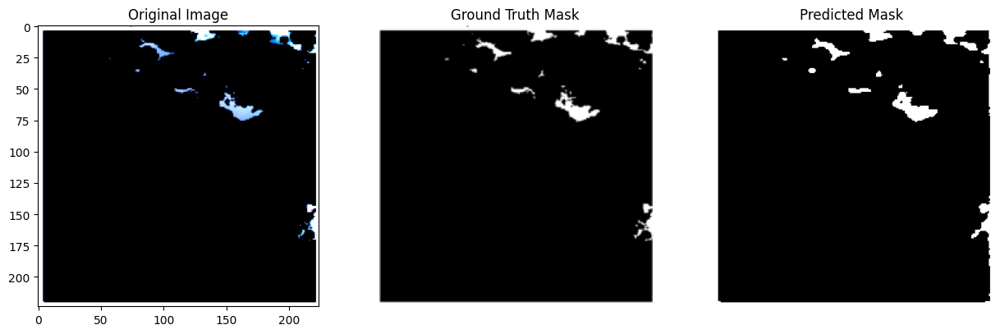

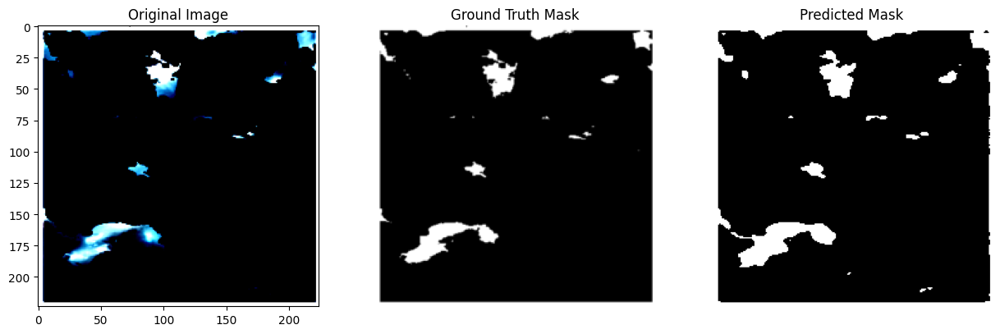

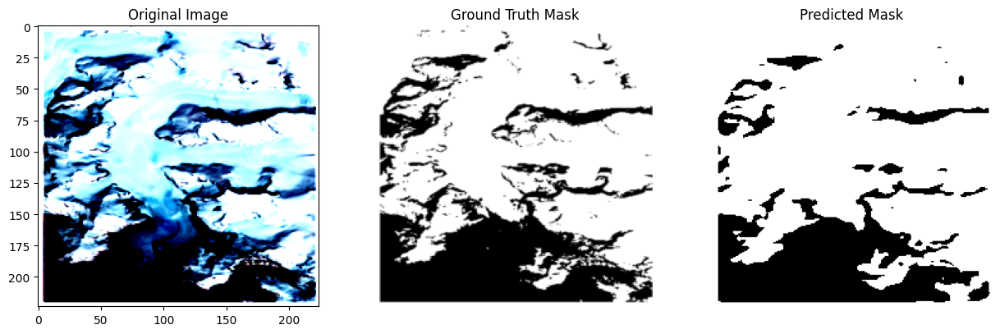

...

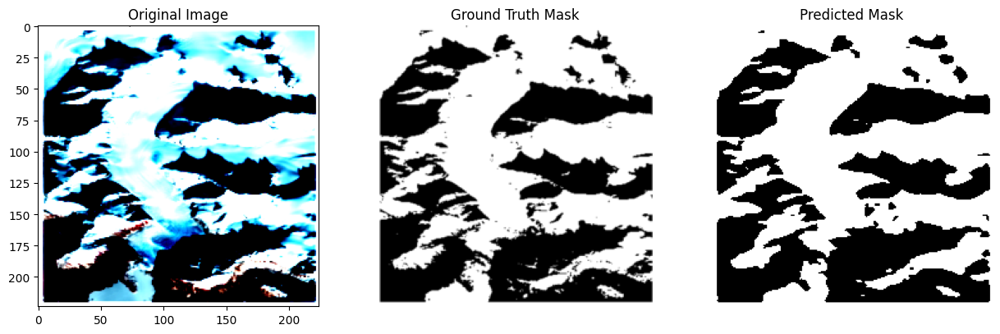

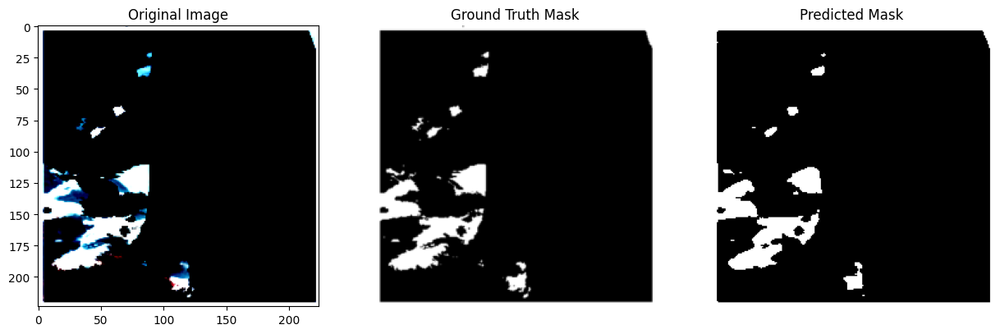

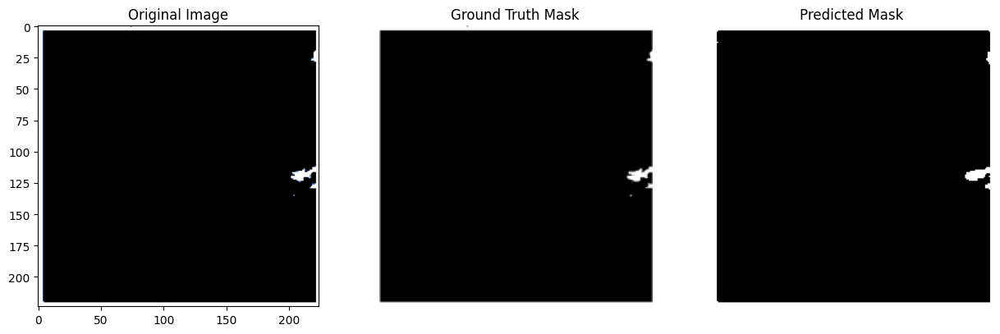

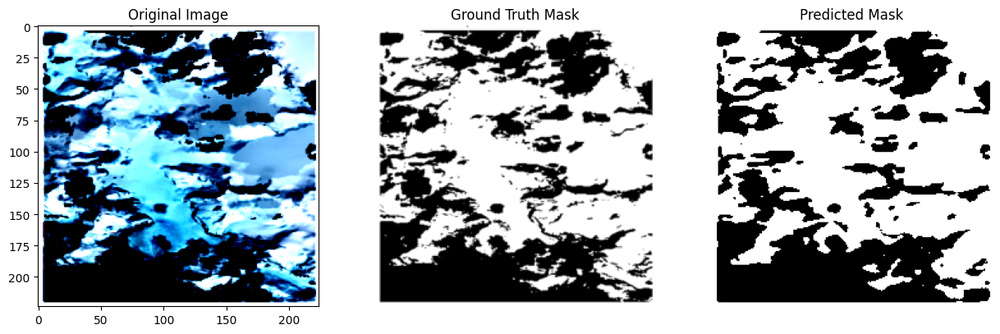

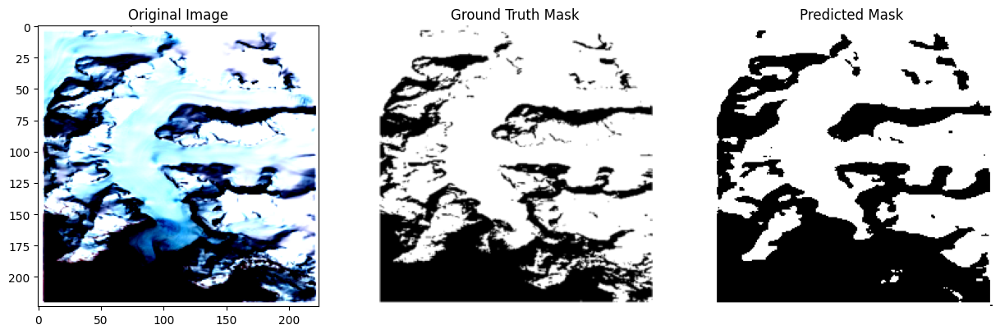

In [22]:
# visualizing the segmented output, similarly, on the best recorded test split.
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)
model = model.to(device)
model.load_state_dict(torch.load('Best_model_resnet50.pth'))
test_image_plot(resnet50_best_test_loader, model)

# UNet with Encoder EfficientNet-b4: Training and Evaluation

In [23]:
# e# keeping all the parameters same for fair comparison, except the encoder, this time, I am using EfficientNet-b4 as the encoder and again utilizing DICE LOSS as my evaluation metrics.
k_folds_results = []
efficientb4_best_test_loss = 10000
loss = smp.losses.DiceLoss(mode='binary')
for fold, (train_index, test_index) in enumerate(kf.split(indices)):
  train_image_paths = [image_paths[i] for i in train_index]
  train_mask_paths = [mask_paths[i] for i in train_index]
  test_image_paths = [image_paths[i] for i in test_index]
  test_mask_paths = [mask_paths[i] for i in test_index]
  print(len(train_index), len(test_index))
  train_dataset = SegmentationDataset(train_image_paths, train_mask_paths)
  test_dataset = SegmentationDataset(test_image_paths, test_mask_paths)
  train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
  test_loader = DataLoader(test_dataset, batch_size=8, shuffle=True)
  model = smp.Unet(
    encoder_name="efficientnet-b4",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
  )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
  for epoch in tqdm(range(30)):
    train_loss = train(model, train_loader, optimizer, loss, device)
    test_loss = test(model, test_loader, loss, device)
    if test_loss < efficientb4_best_test_loss:
        efficientb4_best_test_loss = test_loss
        torch.save(model.state_dict(), f"Best_model_efficientnet-b4.pth")
        print('\nBest Model Saved with Test Loss: ', efficientb4_best_test_loss)
        best_test_loader = test_loader
  k_folds_results.append(test_loss)
print("\nCross Validation Results: ", k_folds_results)
print("\nAverage_loss: ", sum(k_folds_results)/len(k_folds_results))

64 17


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b4-6ed6700e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b4-6ed6700e.pth
100%|██████████| 74.4M/74.4M [00:00<00:00, 99.4MB/s]
  3%|▎         | 1/30 [00:03<01:44,  3.61s/it]


Best Model Saved with Test Loss:  0.5882881879806519


  7%|▋         | 2/30 [00:07<01:40,  3.59s/it]


Best Model Saved with Test Loss:  0.3454504609107971


 10%|█         | 3/30 [00:10<01:39,  3.68s/it]


Best Model Saved with Test Loss:  0.2925245364507039


 20%|██        | 6/30 [00:21<01:21,  3.41s/it]


Best Model Saved with Test Loss:  0.24382934967676798


 23%|██▎       | 7/30 [00:24<01:18,  3.40s/it]


Best Model Saved with Test Loss:  0.2234219710032145


 27%|██▋       | 8/30 [00:28<01:18,  3.58s/it]


Best Model Saved with Test Loss:  0.19332840045293173


 43%|████▎     | 13/30 [00:44<00:57,  3.36s/it]


Best Model Saved with Test Loss:  0.16672492027282715


 47%|████▋     | 14/30 [00:48<00:54,  3.41s/it]


Best Model Saved with Test Loss:  0.1568791667620341


 50%|█████     | 15/30 [00:52<00:52,  3.49s/it]


Best Model Saved with Test Loss:  0.1492154598236084


 63%|██████▎   | 19/30 [01:05<00:36,  3.30s/it]


Best Model Saved with Test Loss:  0.1374808152516683


 67%|██████▋   | 20/30 [01:08<00:34,  3.48s/it]


Best Model Saved with Test Loss:  0.13637512922286987


 77%|███████▋  | 23/30 [01:18<00:23,  3.32s/it]


Best Model Saved with Test Loss:  0.13440082470575967


 80%|████████  | 24/30 [01:22<00:21,  3.53s/it]


Best Model Saved with Test Loss:  0.1250508427619934


 87%|████████▋ | 26/30 [01:29<00:13,  3.38s/it]


Best Model Saved with Test Loss:  0.11127557357152303


 90%|█████████ | 27/30 [01:32<00:10,  3.47s/it]


Best Model Saved with Test Loss:  0.11029197772343953


100%|██████████| 30/30 [01:42<00:00,  3.43s/it]


Best Model Saved with Test Loss:  0.10354051987330119
65 16



100%|██████████| 30/30 [01:37<00:00,  3.25s/it]


65 16


100%|██████████| 30/30 [01:38<00:00,  3.30s/it]


65 16


 57%|█████▋    | 17/30 [00:55<00:42,  3.26s/it]


Best Model Saved with Test Loss:  0.10247871279716492


 60%|██████    | 18/30 [00:59<00:41,  3.50s/it]


Best Model Saved with Test Loss:  0.10090109705924988


 63%|██████▎   | 19/30 [01:03<00:38,  3.53s/it]


Best Model Saved with Test Loss:  0.09857523441314697


 67%|██████▋   | 20/30 [01:07<00:35,  3.54s/it]


Best Model Saved with Test Loss:  0.09771072864532471


 70%|███████   | 21/30 [01:10<00:32,  3.57s/it]


Best Model Saved with Test Loss:  0.09360665082931519


 77%|███████▋  | 23/30 [01:17<00:24,  3.53s/it]


Best Model Saved with Test Loss:  0.0908949077129364


 83%|████████▎ | 25/30 [01:24<00:17,  3.46s/it]


Best Model Saved with Test Loss:  0.0896935760974884


 87%|████████▋ | 26/30 [01:28<00:14,  3.60s/it]


Best Model Saved with Test Loss:  0.08523815870285034


 90%|█████████ | 27/30 [01:31<00:10,  3.60s/it]


Best Model Saved with Test Loss:  0.08254817128181458


 93%|█████████▎| 28/30 [01:35<00:07,  3.60s/it]


Best Model Saved with Test Loss:  0.08028459548950195


 97%|█████████▋| 29/30 [01:39<00:03,  3.72s/it]


Best Model Saved with Test Loss:  0.07955124974250793


100%|██████████| 30/30 [01:42<00:00,  3.43s/it]


65 16


100%|██████████| 30/30 [01:37<00:00,  3.24s/it]


Cross Validation Results:  [0.10354051987330119, 0.12339892983436584, 0.10623571276664734, 0.08003151416778564, 0.09705880284309387]

Average_loss:  0.10205309589703879


<ipython-input-24-d3efdd47aea9>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('Best_model_efficientnet-b4.pth'))


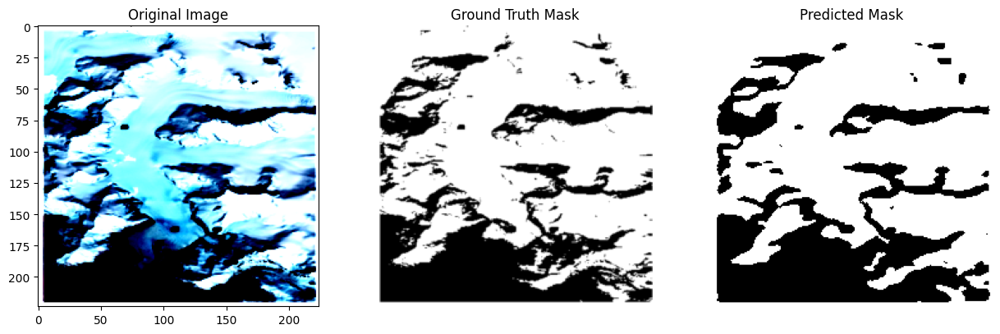

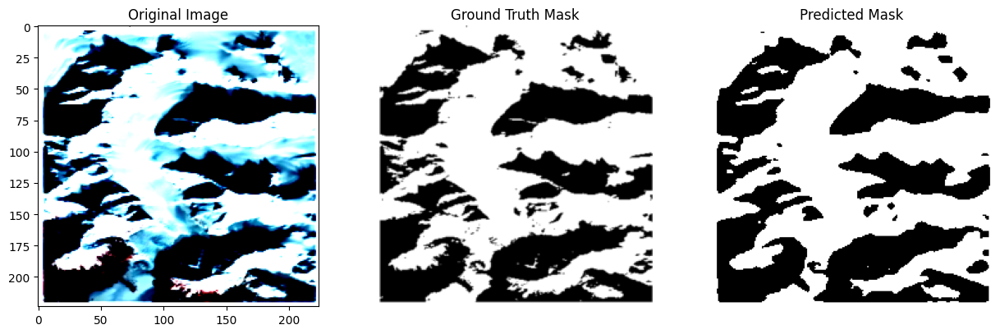

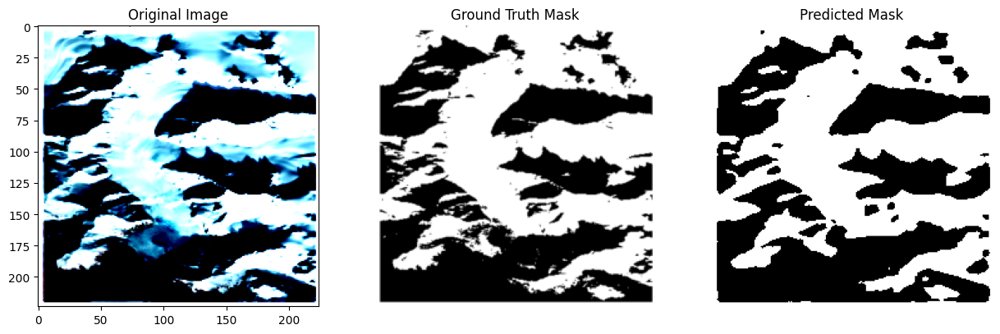

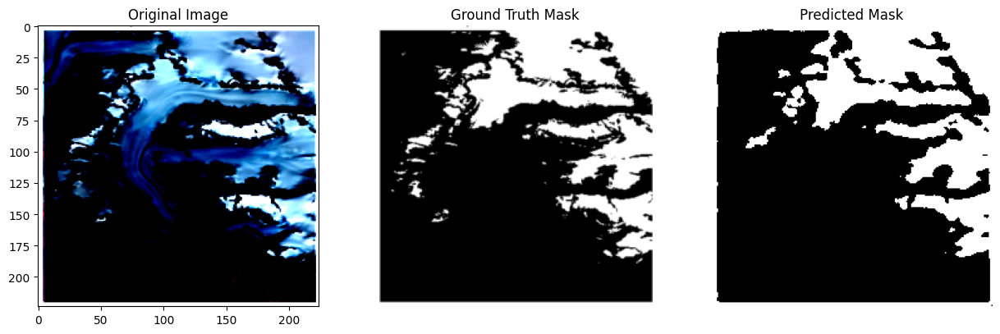

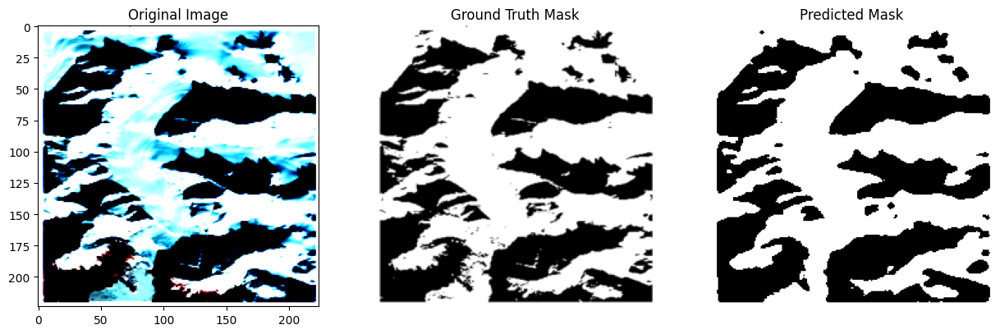

...

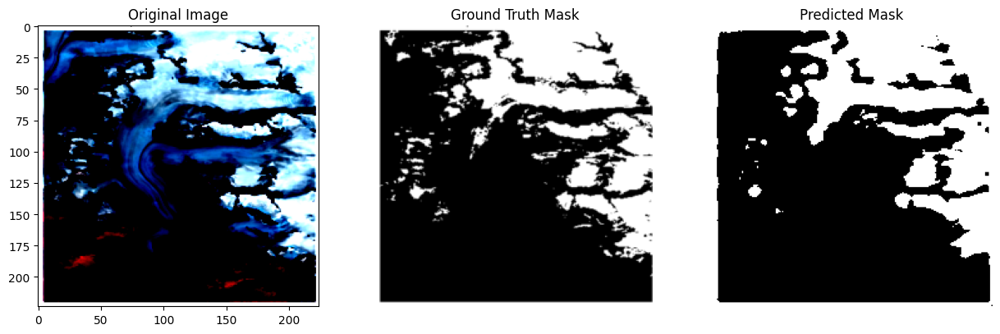

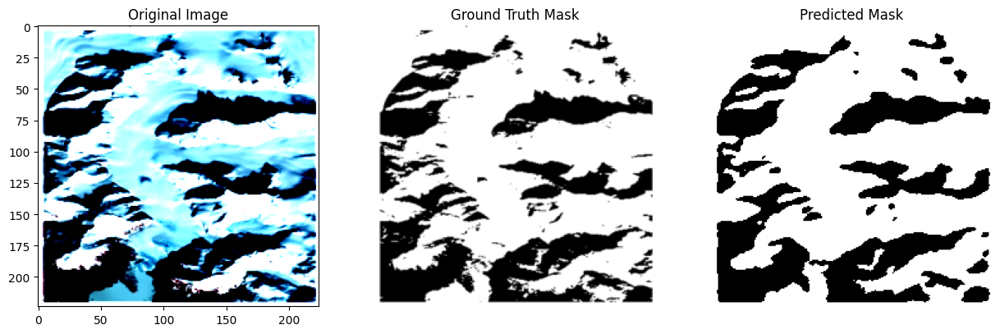

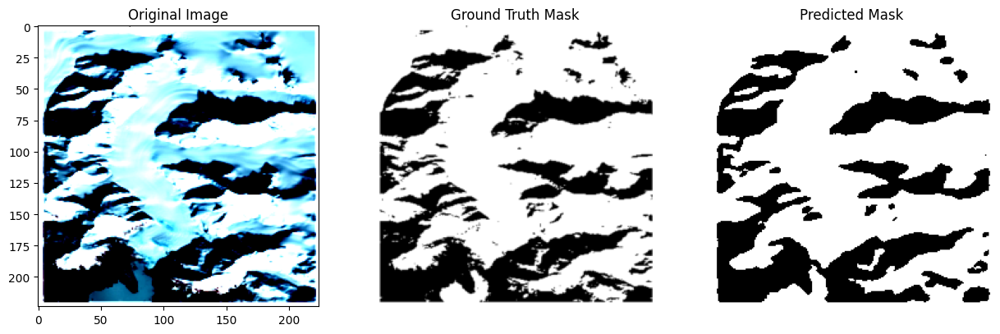

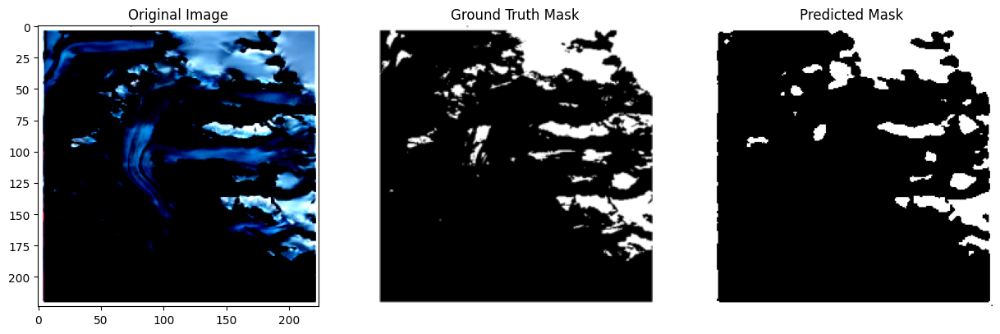

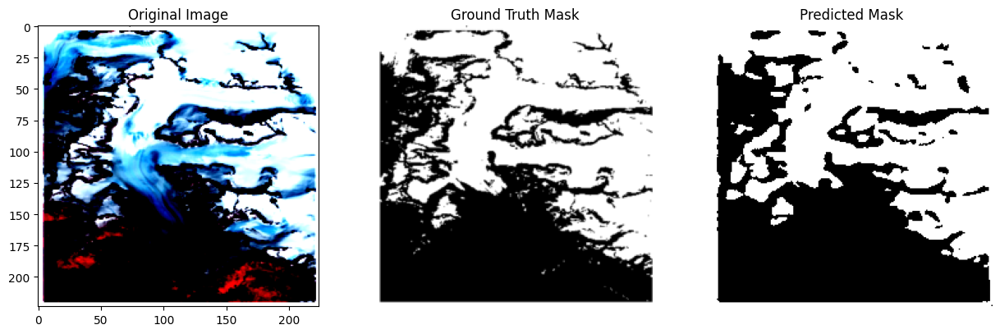

In [24]:
# again doing the visualization of model performance on segmented mask, using the best test split, but this time using efficientnet-b4 as the backbone.
model = smp.Unet(
    encoder_name="efficientnet-b4",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
)
model = model.to(device)
model.load_state_dict(torch.load('Best_model_efficientnet-b4.pth'))
test_image_plot(best_test_loader, model)

# Comparison of All Three Models | Best Performing Model based on Loss Scores - ResNet34

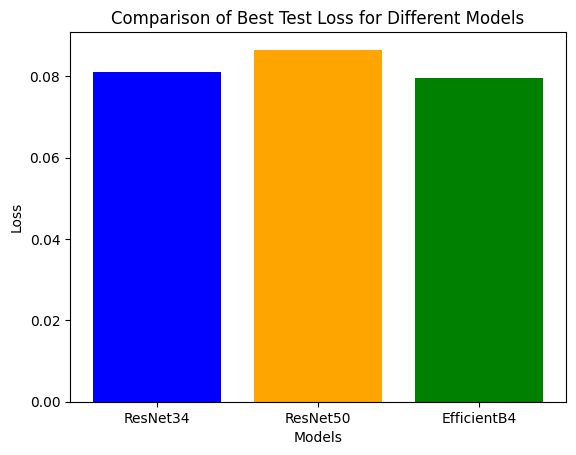

In [25]:
# # Performance explanation using BarPlot:
# - ResNet34 performed best as it has sufficient capacity for the dataset's complexity while being less prone to overfitting.
# - EfficientNet-B4 performed well due to its advanced design but may require more data or hyperparameter tuning for optimal performance.
# - ResNet50 underperformed because its higher complexity likely led to overfitting on the available data, reducing test loss performance.
loss_values = [resnet34_best_test_loss, resnet50_best_test_loss, efficientb4_best_test_loss]
models = ['ResNet34', 'ResNet50', 'EfficientB4']
plt.bar(models, loss_values, color=['blue', 'orange', 'green'])
plt.title('Comparison of Best Test Loss for Different Models')
plt.xlabel('Models')
plt.ylabel('Loss')
plt.show()

In [26]:
# printing the inidvidual values for clear comparison, as explained in the previous cell, resnet34 shows the best performace, for the given parameters, followed by efficientnet-b4 and resnet50, respectively.
resnet34_best_test_loss, resnet50_best_test_loss, efficientb4_best_test_loss

(0.08100565274556477, 0.08649138609568278, 0.07955124974250793)

For encoder - resnet34


<ipython-input-27-62e9b54a6186>:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f'Best_model_{encoder_name}.pth'))


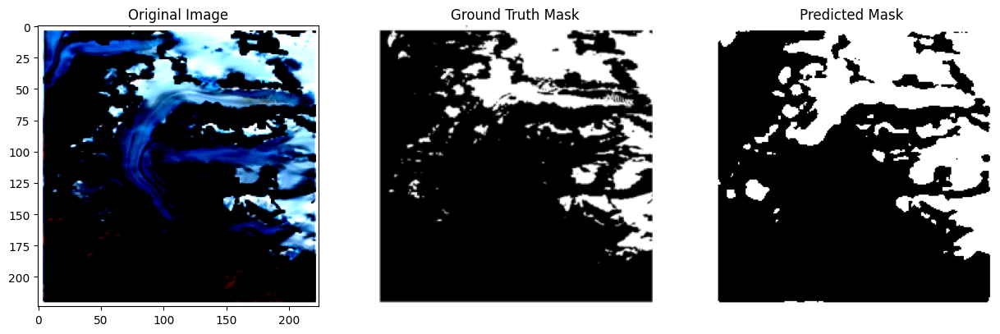

For encoder - resnet50


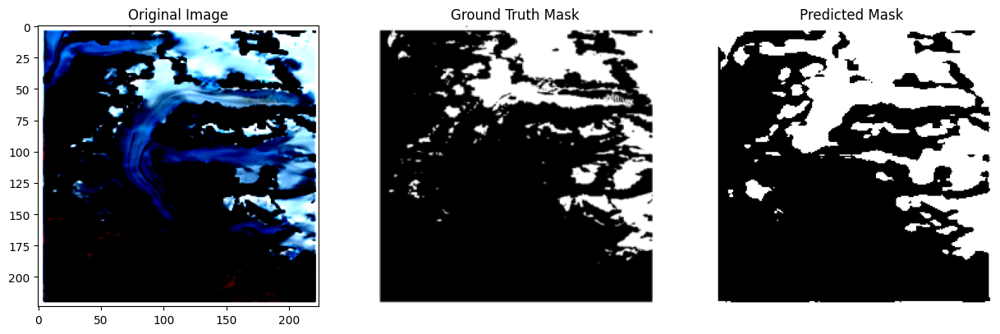

For encoder - efficientnet-b4


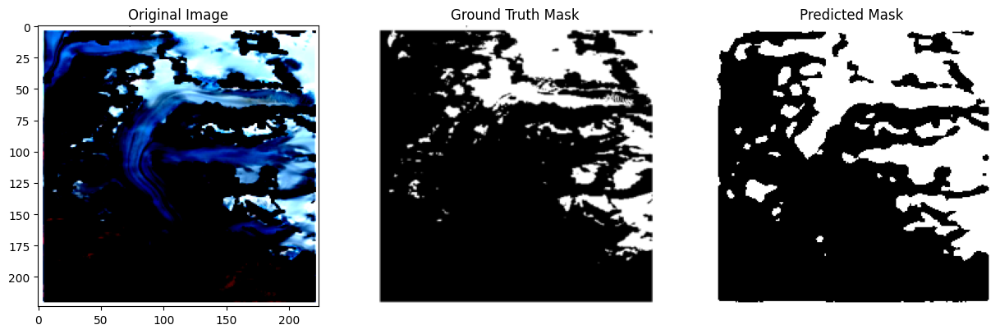

In [27]:
# comparing the predicted output of the best weights saved for all the three models on one sample test image (this was not used during previous testing/validation phase).
# On closer obervation, it can be viewed that ResNet34 segments minor regions better followed by efficientNet-b4 and ResNet50, however the latter two perform almost similar.
test_dataset = SegmentationDataset([image_paths[81]], [mask_paths[81]])
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

for encoder_name in ["resnet34", "resnet50", "efficientnet-b4"]:
  print(f'For encoder - {encoder_name}')
  model = smp.Unet(
    encoder_name=encoder_name,
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
  )
  model = model.to(device)
  model.load_state_dict(torch.load(f'Best_model_{encoder_name}.pth'))
  test_image_plot(test_loader, model)

# Limitation of Model and Further Improvement:

General Limitations of UNet:

Loss of Fine Details: Despite the skip connections, UNet may still lose some fine-grained spatial details during downsampling and upsampling, particularly for high-resolution images.

Limited Generalization to Complex Boundaries: For tasks like glacier segmentation, where boundaries can be highly irregular, UNet might struggle with accurately capturing edge details.

Memory Consumption: UNet can be computationally expensive, especially when using high-resolution inputs and deeper backbones like ResNet50 or EfficientNet.
Imbalance in Class Representations: UNet can struggle with imbalanced data (e.g., when glacier pixels are much fewer than the background), leading to poor segmentation of minority classes.

# Scope for Further Improvement

Architectural Enhancements:

Attention Mechanisms: Incorporate attention modules (e.g., SE blocks, CBAM, or spatial attention) to help the model focus on key regions of interest.

Hybrid Models: Use UNet variants like UNet++ or UNet3+ that improve skip connections and multiscale feature aggregation.

Multi-Scale Context: Incorporate features like ASPP (Atrous Spatial Pyramid Pooling) or Pyramid Attention to better capture global context.

Data Augmentation and Preprocessing:
Use advanced data augmentation techniques like elastic transformations, CLAHE (Contrast Limited Adaptive Histogram Equalization), or domain-specific augmentations to improve robustness.
Normalize images to minimize variations due to lighting and weather conditions.

Better Loss Functions:
Use task-specific loss functions like Dice Loss, Tversky Loss, or Focal Loss to address class imbalance and improve boundary segmentation.

# Deployment Considerations

Here, the first step for deploying any model would be exporting it as .pth file, which is storing its weights,
which as seen in the above code, I have already saved the models.

I have created a global loss variable, which keeps track of the lowest loss achieved across all cross validation steps, and
saved the best one, and everytime new minimum loss would be obtained, model for that step using torch.save(model.state_dict(), f"Best_model_{model_name}.pth")
will be saved.

Then there are two types of deplpoyment possible:

(a) Cloud-based Deployment:

Possible Cloud Platforms: AWS(Sage Maker), Azure, and Google Cloud
I prefer Google Cloud because of its integration with BigQuery for data analytics, and support for Google Earth Engine,
the primary source of my dataset.

Steps to Deploy on Google Cloud Platform:

1) Set up your project and environment.
2) Create an image classification dataset, and import images.
3) Train an AutoML image classification model.
4) Evaluate and analyze model performance.
5) Deploy a model to an endpoint, and send a prediction.
6) Clean up your project.

I got these steps from this tutorial: https://cloud.google.com/vertex-ai/docs/tutorials/image-classification-automl

Alternatively, we can also choose it deploy it as an Docker:

A sample docker file would look something like this:

FROM pytorch/pytorch:latest

WORKDIR /app

COPY . /app

RUN pip install -r requirements.txt

CMD ["python", "inference_server.py"]

(b) Deploy as an API:

We may use Flask/Django to create an UI, and connect the backend with either our cloud platform or central server.
The reason I am suggesting Flask/Django is because both are Python-based and hence easy to integrate with PyTorch/TensorFlow.
For large-scale deployment, I would Django because of its additional security constraints, whereas for small-scale usage,
Flask would be the easy-to-go option.

(c) Deploy on Edge-Device:

We may deploy the model on edge-devices like Raspberry-Pi or Jetson, though I would suggest using Jetson for this model,
because previously I have worked with both and from my experience I can say that raspberry-pi's dies a lot while running deep
neural networks, while Jetsons provide performance similar to small GPUs.

# Steps to make my model real-time:

1) Create data-fetching code for automatically retrieving latest images from GoogleEarthEngine for a specific timeframe.

Here I have manually given the time-frame but instead of that I can give a specific range and retrieve the files that fit in only that range.

Though some additional problems may arise: it is not necessary that everytime a file would arrive on time, satellites may often delay in sending
files for specific time periods, so I will have to sort all the files in the system as per datetime sort and then pick last few files, instead of
keeping a fixed number.

2) Run that data-fetching code on cron-job, it is a linux tool, which runs a described pipleine every few minutes/hours, based on the time-interval we define.

3) Then run the trained model in eval model to generate segmented masks.

4) Present the output to a user using some GUI, or store the segmented masks on some permanent storage device.



One more additional feature can be added:

Few features of the images may change over-time, hence our model need to capture those new characteristics, and for that we should incorporate continual learning/increemental learning methoodoly in our model.

Challenges in Continual Learning:

Catastrophic Forgetting: The phenomenon where a model forgets previously learned knowledge when trained on new data.

Scalability: Handling an ever-increasing amount of data without requiring large storage or computational resources.

Data Distribution Shift: Adapting to changes in the underlying data distribution over time (non-stationarity).

Efficient Memory Usage: Ensuring the model doesn't require storing all previous data, which might be impractical in dynamic environments.

Methods to Incorporate Continual Learning:

Regularization-based methods (EWC, MAS).

Replay-based methods (Experience Replay, Generative Replay).

Dynamic architecture methods (Progressive Networks, PathNet).

Meta-learning methods (MAML, Reptile).

Neuro-inspired methods (Self-Organizing Maps, Hebbian Learning).

Knowledge distillation methods for transferring knowledge across task

# Ethical Consideration

# Fairness:
Bias in Training Data: Here the model is trained on just the images from the data obtained over the alaskan glacier. Bias in Training Data: If the model is trained primarily on data
from certain regions or specific types of glaciers, it could fail to generalize well to other areas or glacier types. For instance, if data is biased towards glaciers in developed countries
or certain geographical regions, the model might underperform when applied to glaciers in less-represented or under-studied regions, resulting in inaccurate assessments and potential unfair
outcomes. Hence we need to make sure that the training datasets are diverse, representing a wide range of glaciers from different regions and climates. Regularly audit the dataset to
identify any biases that may affect the model’s performance

# Societal Impact:

The use of machine learning models in glacier segmentation has significant societal implications, particularly in the context of climate
change and environmental monitoring. As glaciers play a critical role in the Earth's water cycle, accurate segmentation and analysis of
glacier dynamics can help predict future water availability, potential natural disasters, and even climate change trends. However, while
the societal benefits are clear, several ethical issues need to be considered.

# Accuracy vs. Accountability:
If the model is used to make important environmental or policy decisions (e.g., regarding glacier management, water resources, or disaster
prevention), errors in the segmentation model could have large-scale consequences. The ethical dilemma lies in ensuring the model's accuracy
and transparency while avoiding overreliance on the AI system for high-stakes decision-making. Hence one should mplement robust validation processes,
continuous model monitoring, and human-in-the-loop mechanisms to ensure that the model’s predictions are cross-verified with expert knowledge

# StakeHolder Effects:
Various stakeholders are involved in or affected by the development and deployment of glacier segmentation models. These include researchers, environmental
organizations, policy makers, local communities, and industries (e.g., agriculture, tourism, or hydropower).

The information derived from glacier segmentation models may be used for resource management or environmental protection initiatives. However, if this data is not
shared responsibly, it could lead to mismanagement of local resources or environmental degradation, especially in remote or vulnerable areas. One should ensure that
local communities are included in the decision-making process, and any changes informed by model results are communicated transparently to affected populations.

Machine learning systems for environmental monitoring are often developed and deployed by large research institutions or corporations, which may not always act in the best
interest of marginalized communities. These groups might lack access to the technology or the benefits derived from it. Therefore we should promote open-source platforms and
collaborative partnerships to ensure that smaller organizations, local governments, and vulnerable communities have access to the benefits of glacier segmentation and are not left behind.

# Transparency and Accountability:
Machine learning models, especially deep learning models, are often seen as "black boxes" because it can be difficult to understand how they make decisions. For instance, if the glacier segmentation  model misidentifies certain areas as glaciers or non-glaciers, it is important to understand why and how the decision was made. Adopt explainable AI (XAI) techniques
to improve transparency, allowing  stakeholders to understand how the model works and how decisions are made, especially for high-stakes applications.

To implement this, softwares like SHAP/LIME can be used.

#Data Ownership and Consent:
In cases where drone-based or sensor-based data is used to capture information on specific glaciers, issues of data ownership and consent become critical. Who owns the data, and how is it shared?

Without proper consent, data could be used in ways that violate privacy rights or lead to the exploitation of indigenous or local communities.
Here, for this project all the rights are reserved with GoogleEarthEngine.

# Working on the explanaibility of Model for Transparency and Accountability:
I haven't worked in detail on SHAP, which would involve trying out multiple explainers, rather just shown a sample that how can I fit shap values to explain my segmentation model, and in future, if I plan to deploy this, then I can make my model satisfy the condition of "Transparency and Accountability".

In [128]:
!pip install shap
import shap

In [125]:
# SHAP Kernel Explainer Setup: The SHAP explainer is initialized using KernelExplainer, which uses a subset of the test images as the baseline to interpret how the model makes predictions
#  for image data reshaped into 2D.
# SHAP Value Computation: The explainer calculates SHAP values for a single test image (flattened to 2D), quantifying each pixel’s contribution to the model’s output.
# I am using a sample of test data for SHAP
test_images, test_masks = next(iter(test_loader))
test_images = test_images.to(device)

def model_predict(images):
    global model
    reshaped_images = images.reshape(-1, 3, 224, 224)
    images_tensor = torch.tensor(reshaped_images).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(images_tensor)
    return outputs.cpu().numpy()

# Flatten the input images for SHAP
test_images_np = test_images.cpu().numpy().reshape(test_images.shape[0], -1)
# Define the SHAP explainer
explainer = shap.KernelExplainer(model_predict, test_images_np[:5])
# Explain one of the test images
shap_values = explainer.shap_values(test_images_np[0:1])

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Here, incase we need to further understand how each input feature, in this case how each pixel affect the output,
# we can try different visualizations for shap, and even different explainers like DeepExplainer, GradientExplainer can be tried.
# Kernel Explainer: Model-agnostic, works with any model but is slow as it approximates SHAP values using perturbations and a baseline.
# Gradient Explainer: Designed for differentiable models (e.g., neural networks), uses model gradients for faster explanations.
# Deep Explainer: Optimized for deep learning models (like PyTorch or TensorFlow), leveraging model internals for efficient SHAP calculations.